# Mobile Price Classification

### Overview

Using dataset from on [Kaggle](https://www.kaggle.com/iabhishekofficial/mobile-price-classification?select=test.csv) made of  Mobile Prices classification, we look to see  hoo Mobile specification effict on price range . 



# Libraries Importing

These are the needed library imports for problem setup.
* Numpy is utilized to provide many numerical functions needed in the EDA .

* Pandas is very helpful for its ability to support data manipulation (McKinney, 2010). 
* SciPy is utilized to provide signal processing functions (Jones E., et al, 2001). 
* Matplotlib is used for plotting (Hunter, 2007).
* seaborn is used for plotting also

* The Jupyter environment in which this code is presented and was run is a descendant of the IPython environment originated by Pérez & Granger (2007).

In [1]:
%%capture
!pip install category-encoders

# Standard Imports
import pandas as pd # for dataframe processing
import seaborn as sns # The seaborn library makes plots look nice
import matplotlib.pyplot as plt # # The seaborn library makes plots look nicer
import numpy as np #for math processing
sns.set_palette('Set2')  #  nice pallet 
import warnings
warnings.filterwarnings("ignore")  #   egnor warning 
 



# Data loading

In [2]:
df=pd.read_csv('https://raw.githubusercontent.com/helah20/Dataset/main/train.csv')

# Look at data..

In [4]:
df.tail(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,16,483,754,3919,19,4,2,1,1,1,3


In [5]:
print(' the dataset size is :',df.shape) 

 the dataset size is : (2000, 21)


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

# EDA

## Exploring Data

In [8]:
df.describe() #

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,9.916500,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,6.064315,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,5.000000,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [9]:
 df.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

#### the data is clean from null

In [10]:
df.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

#### explore df 

In [11]:
corr=df.corr()
corr.style.background_gradient(cmap='coolwarm')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.000000,0.011252,0.011482,-0.041847,0.033334,0.015665,-0.004004,0.034085,0.001844,-0.029727,0.031441,0.014901,-0.008402,-0.000653,-0.029959,-0.021421,0.052510,0.011522,-0.010516,-0.008343,0.200723
blue,0.011252,1.000000,0.021419,0.035198,0.003593,0.013443,0.041177,0.004049,-0.008605,0.036161,-0.009952,-0.006872,-0.041533,0.026351,-0.002952,0.000613,0.013934,-0.030236,0.010061,-0.021863,0.020573
clock_speed,0.011482,0.021419,1.000000,-0.001315,-0.000434,-0.043073,0.006545,-0.014364,0.012350,-0.005724,-0.005245,-0.014523,-0.009476,0.003443,-0.029078,-0.007378,-0.011432,-0.046433,0.019756,-0.024471,-0.006606
dual_sim,-0.041847,0.035198,-0.001315,1.000000,-0.029123,0.003187,-0.015679,-0.022142,-0.008979,-0.024658,-0.017143,-0.020875,0.014291,0.041072,-0.011949,-0.016666,-0.039404,-0.014008,-0.017117,0.022740,0.017444
fc,0.033334,0.003593,-0.000434,-0.029123,1.000000,-0.016560,-0.029133,-0.001791,0.023618,-0.013356,0.644595,-0.009990,-0.005176,0.015099,-0.011014,-0.012373,-0.006829,0.001793,-0.014828,0.020085,0.021998
four_g,0.015665,0.013443,-0.043073,0.003187,-0.016560,1.000000,0.008690,-0.001823,-0.016537,-0.029706,-0.005598,-0.019236,0.007448,0.007313,0.027166,0.037005,-0.046628,0.584246,0.016758,-0.017620,0.014772
int_memory,-0.004004,0.041177,0.006545,-0.015679,-0.029133,0.008690,1.000000,0.006886,-0.034214,-0.028310,-0.033273,0.010441,-0.008335,0.032813,0.037771,0.011731,-0.002790,-0.009366,-0.026999,0.006993,0.044435
m_dep,0.034085,0.004049,-0.014364,-0.022142,-0.001791,-0.001823,0.006886,1.000000,0.021756,-0.003504,0.026282,0.025263,0.023566,-0.009434,-0.025348,-0.018388,0.017003,-0.012065,-0.002638,-0.028353,0.000853
mobile_wt,0.001844,-0.008605,0.012350,-0.008979,0.023618,-0.016537,-0.034214,0.021756,1.000000,-0.018989,0.018844,0.000939,0.000090,-0.002581,-0.033855,-0.020761,0.006209,0.001551,-0.014368,-0.000409,-0.030302
n_cores,-0.029727,0.036161,-0.005724,-0.024658,-0.013356,-0.029706,-0.028310,-0.003504,-0.018989,1.000000,-0.001193,-0.006872,0.024480,0.004868,-0.000315,0.025826,0.013148,-0.014733,0.023774,-0.009964,0.004399


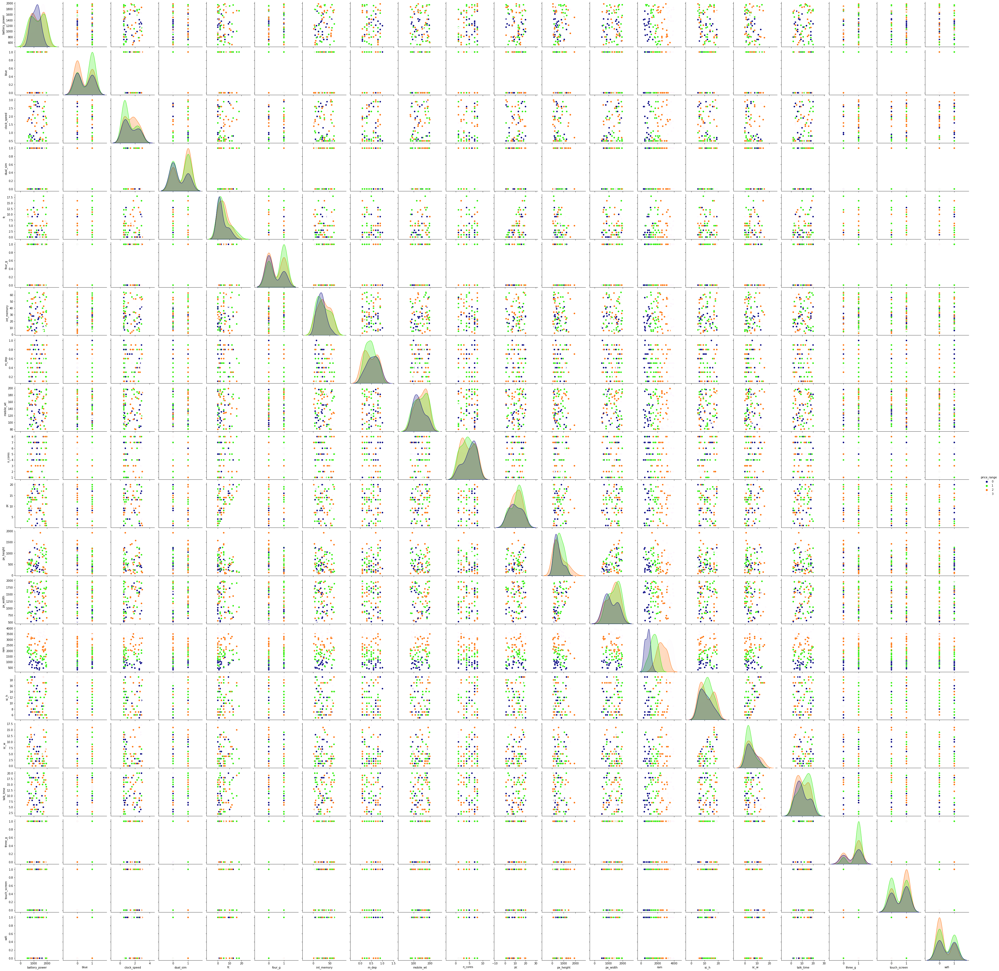

In [12]:
sns.pairplot(data=df.sample(100) ,hue='price_range' , palette='gist_ncar') 

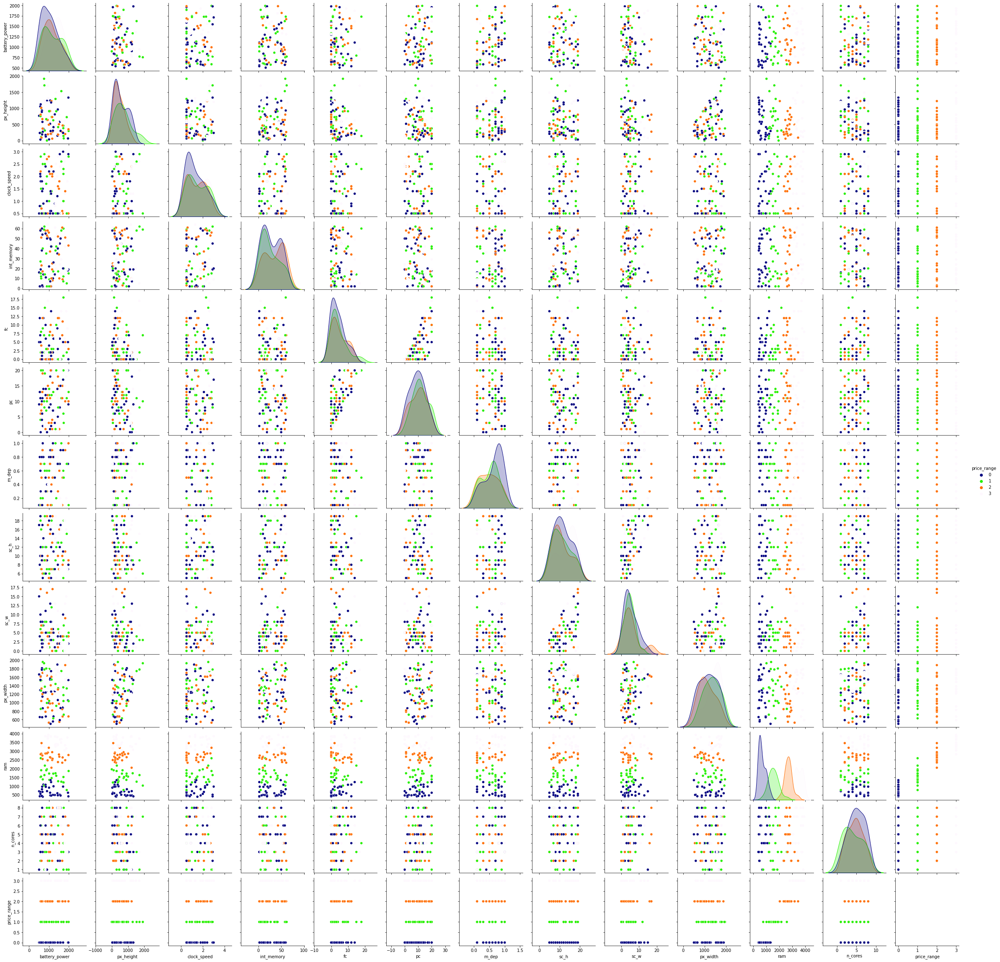

In [13]:

x_vars='battery_power','px_height','clock_speed','int_memory','fc','pc','m_dep','sc_h', 'sc_w','px_width', 'ram','n_cores','price_range'
y_vars='battery_power','px_height','clock_speed','int_memory','fc','pc','m_dep','sc_h', 'sc_w','px_width', 'ram','n_cores','price_range'
sns.pairplot(data=df.sample(100) ,hue='price_range' , palette='gist_ncar',x_vars=x_vars ,y_vars=y_vars )

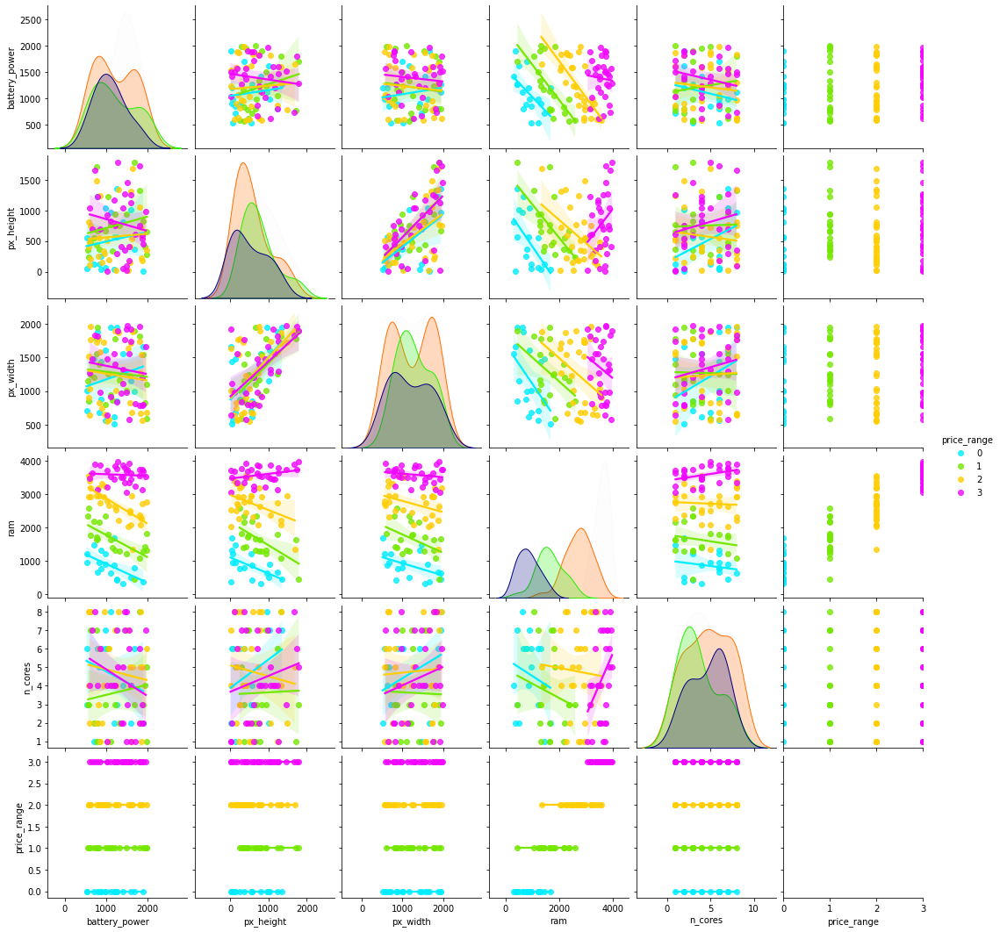

In [14]:

x_vars='battery_power','px_height', 'px_width', 'ram','n_cores','price_range'
y_vars='battery_power','px_height', 'px_width', 'ram','n_cores', 'price_range'
sns.pairplot(data=df.sample(100) ,hue='price_range' , palette='gist_ncar',x_vars=x_vars ,y_vars=y_vars, kind= 'reg')


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


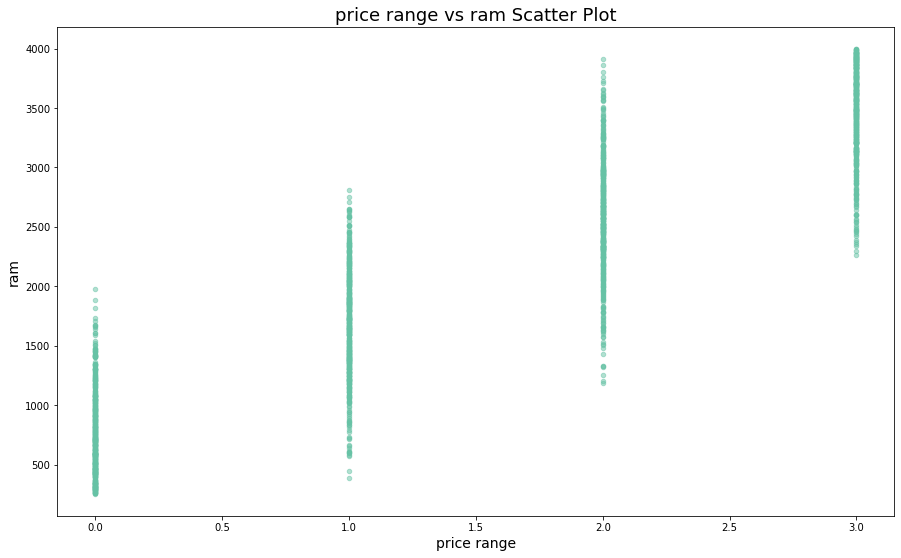

In [15]:
df.plot(kind='scatter', x='price_range', y='ram',alpha = 0.5,figsize=(15,9))
plt.xlabel('price range',fontdict={'fontsize':14})          
plt.ylabel('ram' ,fontdict={'fontsize':14})
plt.title('price range vs ram Scatter Plot',fontdict={'fontsize':18}) ;       

In [16]:
# Plotting all data 
df_vis = df
df_vis.plot(kind= 'density',subplots = True,figsize=(100,200),title='Desity of feature over all' ,fontsize=18 )
plt.show()


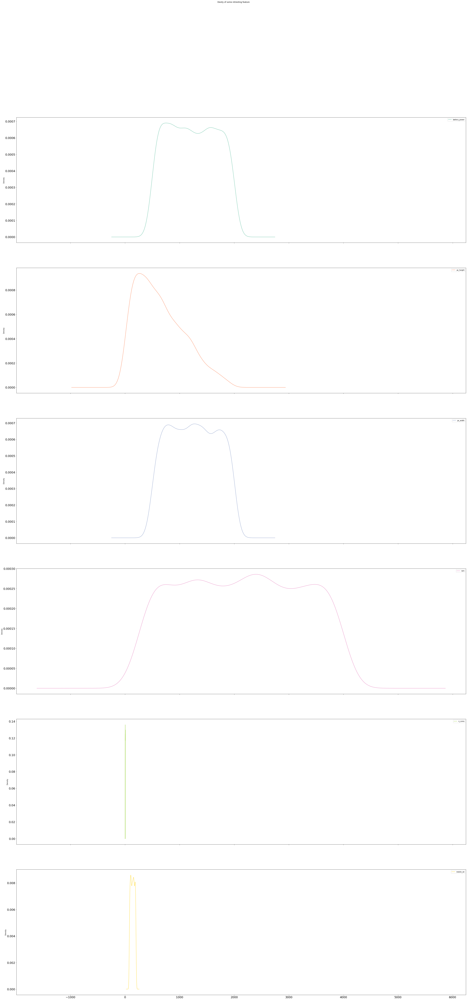

In [17]:
# Plotting all data 
df_vis = df.loc[:,['battery_power','px_height', 'px_width', 'ram','n_cores','mobile_wt']]
df_vis.plot(kind= 'density',subplots = True,figsize=(50,100) ,title='Desity of some intresting feature ' ,fontsize=18 )

plt.show()
# it is confusing

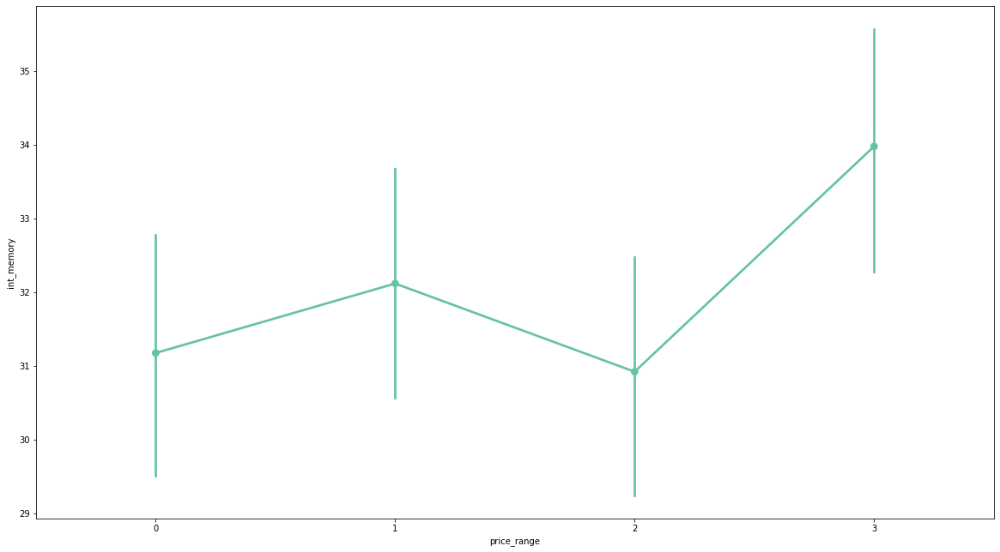

In [18]:
fig=plt.figure(figsize=(20,11))
sns.pointplot(y="int_memory", x="price_range", data=df)

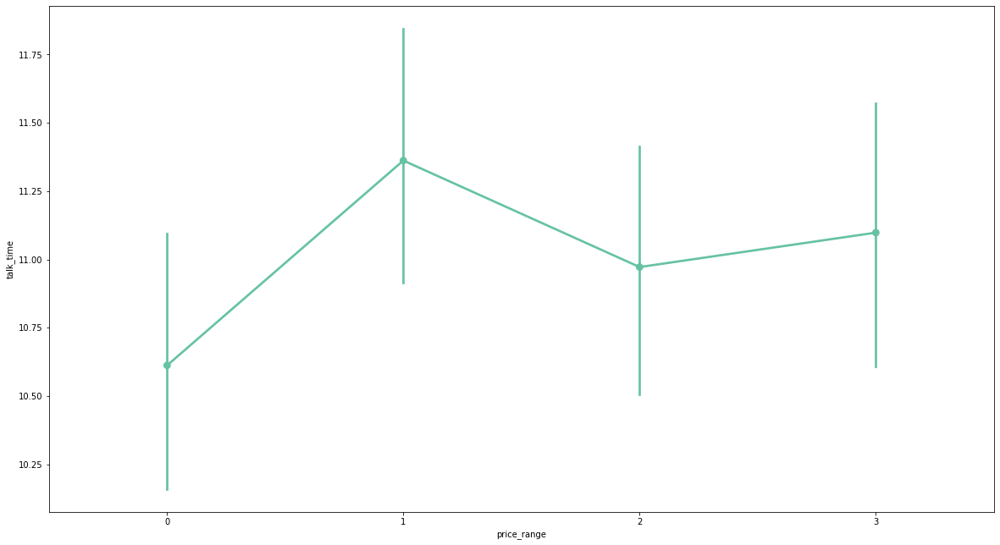

In [19]:
fig=plt.figure(figsize=(20,11))
sns.pointplot(y="talk_time", x="price_range", data=df)

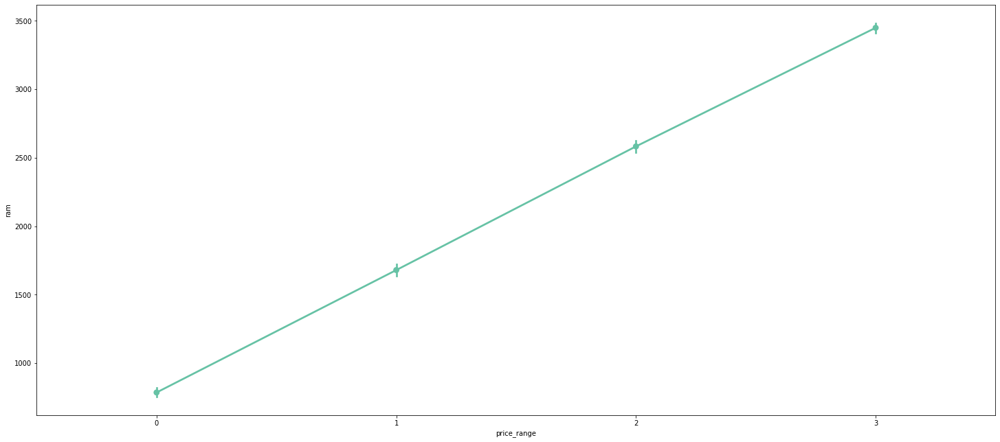

In [20]:
fig=plt.figure(figsize=(25,11))
sns.pointplot(y="ram", x="price_range", data=df)

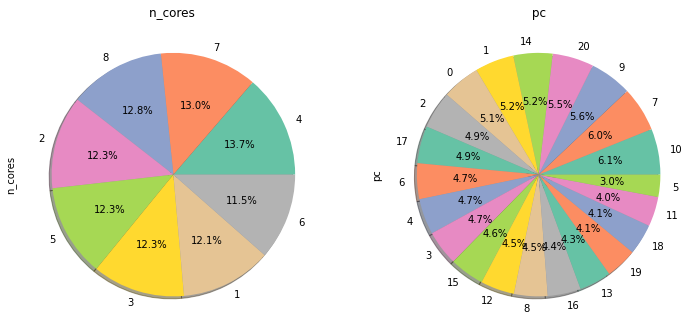

In [21]:
#pie chart 

f,ax=plt.subplots(1,2,figsize=(12,12))
df['n_cores'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
df['pc'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True)




ax[0].set_title('n_cores ')
ax[1].set_title(' pc ')

plt.show()

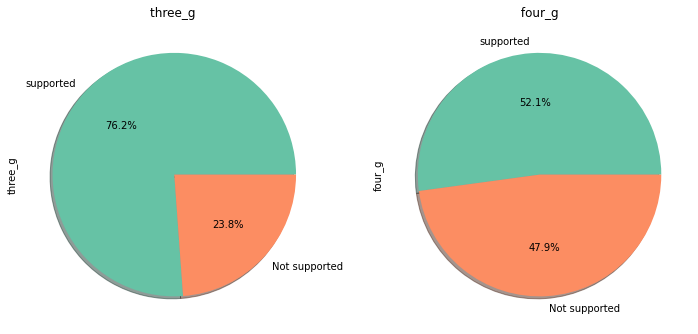

In [22]:
labels = ["supported",'Not supported']
f,ax=plt.subplots(1,2,figsize=(12,12))
df['three_g'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True, labels=labels)
df['four_g'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True, labels=labels)




ax[0].set_title('three_g ')
ax[1].set_title(' four_g ')

plt.show()

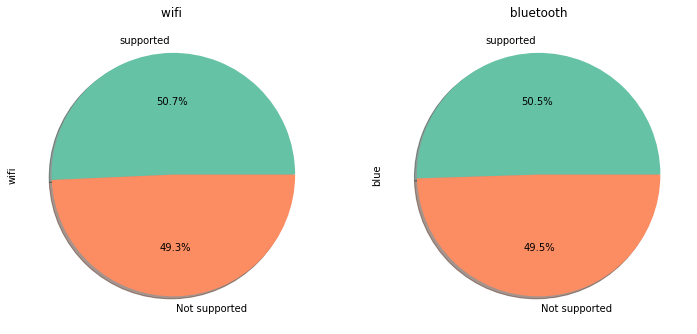

In [23]:
labels = ["supported",'Not supported']
f,ax=plt.subplots(1,2,figsize=(12,12))
df['wifi'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True, labels=labels)
df['blue'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True, labels=labels)




ax[0].set_title('wifi ')
ax[1].set_title(' bluetooth ')

plt.show()

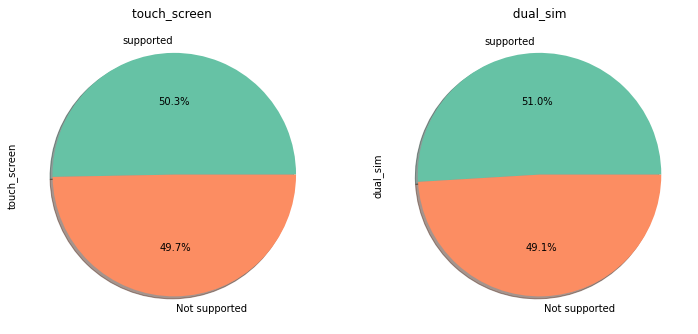

In [24]:
labels = ["supported",'Not supported']
f,ax=plt.subplots(1,2,figsize=(12,12))
df['touch_screen'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True, labels=labels)
df['dual_sim'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True, labels=labels)




ax[0].set_title('touch_screen ')
ax[1].set_title(' dual_sim ')

plt.show()

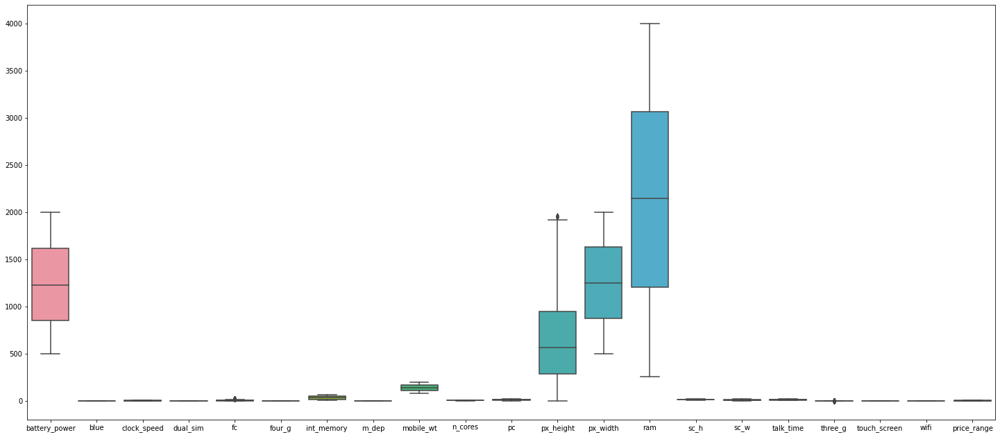

In [25]:
fig=plt.figure(figsize=(25,11))
# col=['id','target']
sns.boxplot(data=df)
plt.show()

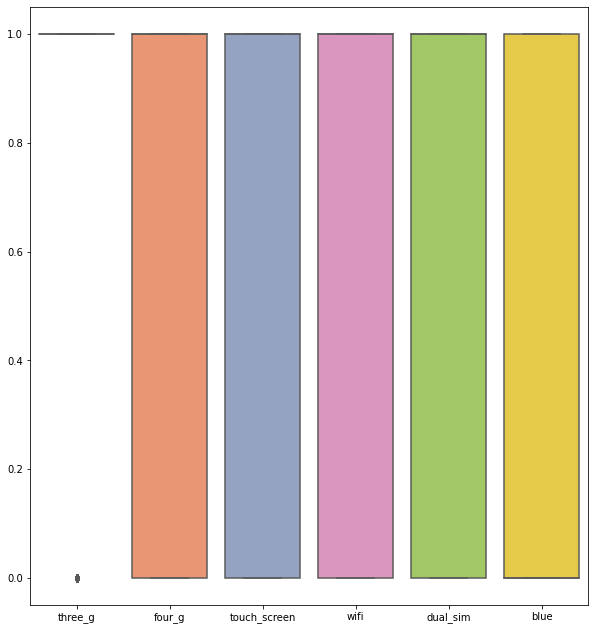

In [26]:
fig=plt.figure(figsize=(10,11)) #why 3g represent like this !!
sns.boxplot(data=df[['three_g', 'four_g','touch_screen', 'wifi' ,'dual_sim', 'blue']])
plt.show()

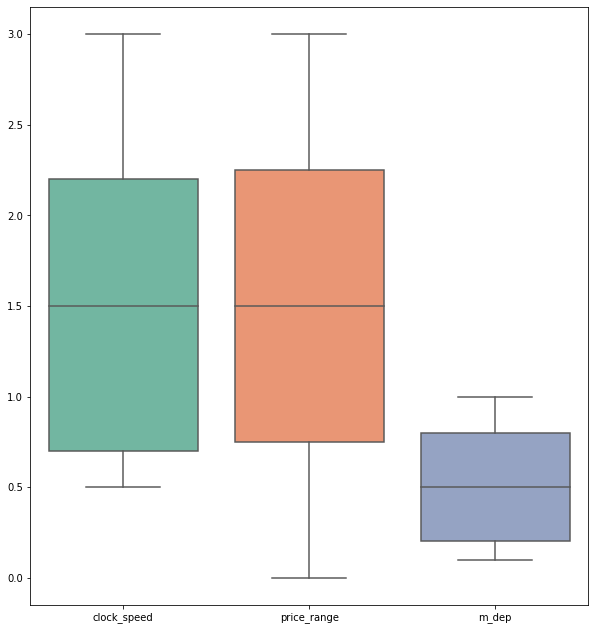

In [27]:
fig=plt.figure(figsize=(10,11))

sns.boxplot(data=df[[ 'clock_speed',  'price_range','m_dep']])
plt.show()

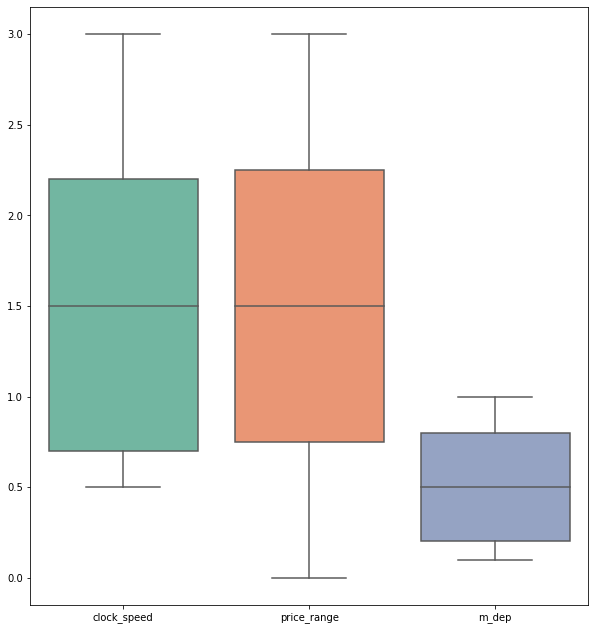

In [28]:
fig=plt.figure(figsize=(10,11))

sns.boxplot(data=df[[ 'clock_speed',  'price_range','m_dep']])
plt.show()

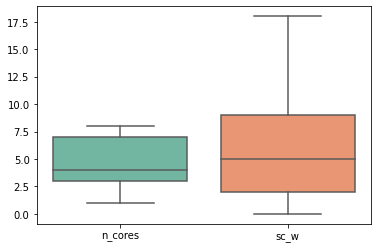

In [29]:
sns.boxplot(data=df[[   'n_cores' ,'sc_w']])
plt.show()

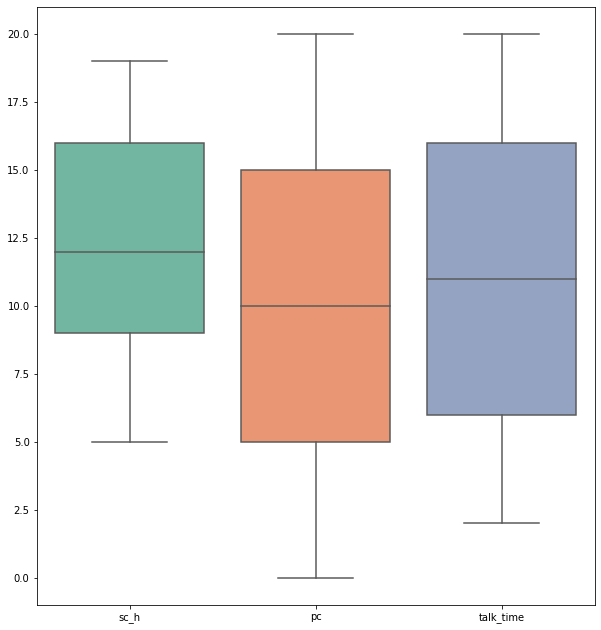

In [30]:
fig=plt.figure(figsize=(10,11))
sns.boxplot(data=df[['sc_h', 'pc', 'talk_time']])
plt.show()

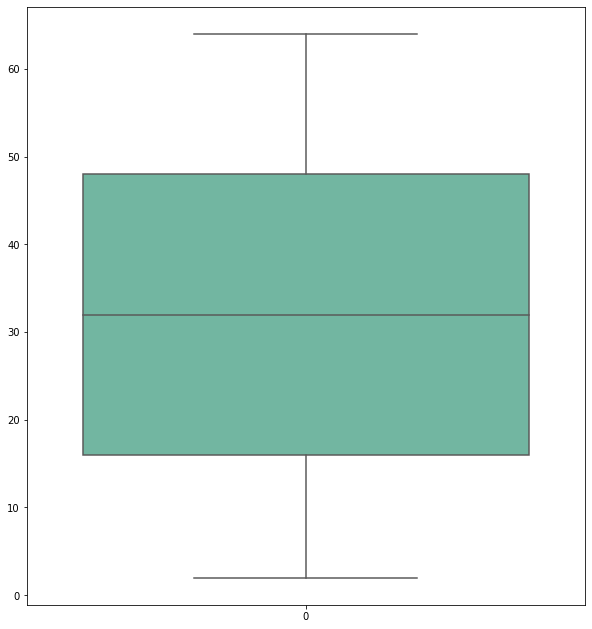

In [31]:
fig=plt.figure(figsize=(10,11))
sns.boxplot(data=df['int_memory'])
plt.show()

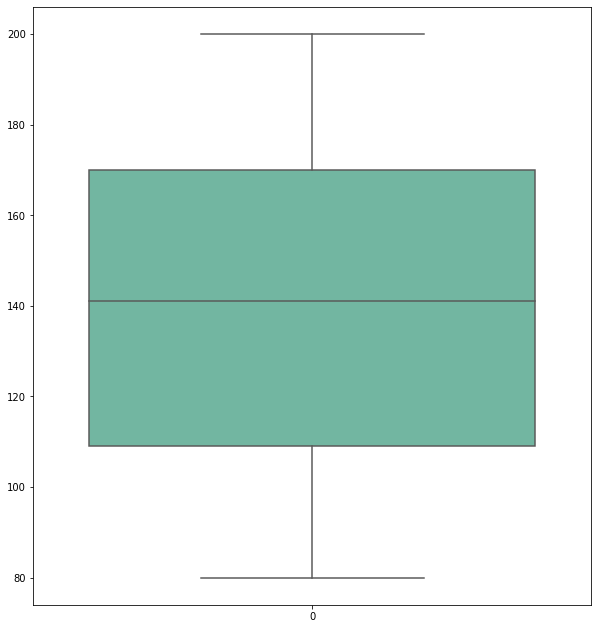

In [32]:
fig=plt.figure(figsize=(10,11))
sns.boxplot(data=df['mobile_wt'])
plt.show()

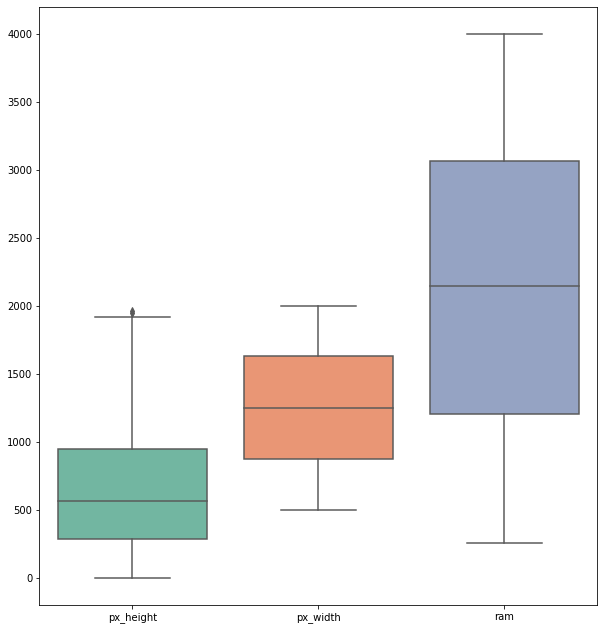

In [33]:
fig=plt.figure(figsize=(10,11))
sns.boxplot(data=df[[ 'px_height','px_width', 'ram']])
plt.show()

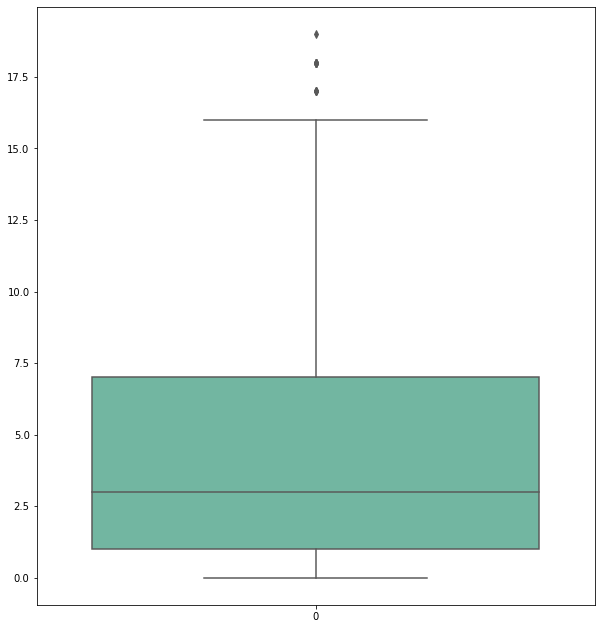

In [34]:
fig=plt.figure(figsize=(10,11)) # there is outlier in Front Camera mega pixels but that's normal , we didn't need to remove it 
sns.boxplot(data=df['fc'])
plt.show()

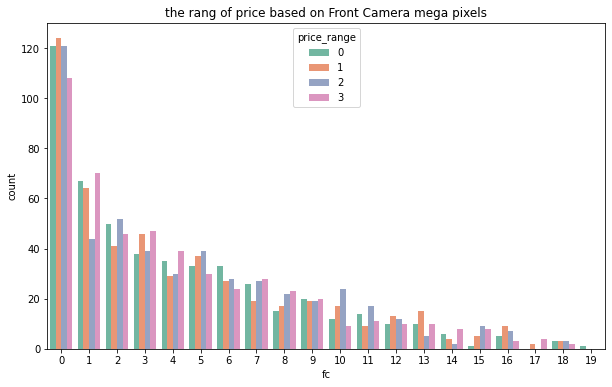

In [35]:
# df.fc.value_counts()
plt.figure(figsize=(10,6))

sns.countplot(x='fc', data=df, hue= 'price_range').set_title('the rang of price based on Front Camera mega pixels',fontsize=12);

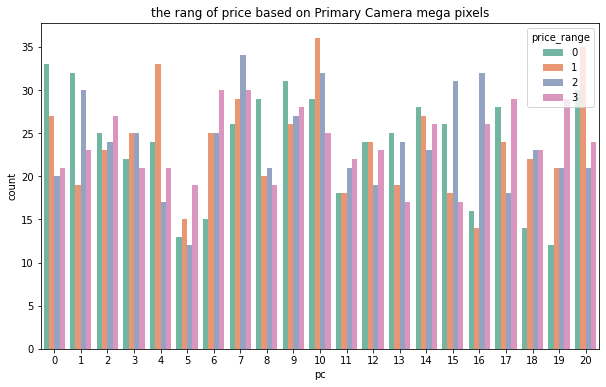

In [36]:
plt.figure(figsize=(10,6))

sns.countplot(x='pc', data=df, hue= 'price_range').set_title('the rang of price based on Primary Camera mega pixels',fontsize=12);

In [14]:
# Distribution graphs (histogram/bar graph) of column data
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 2 ]] # For displaying purposes, pick columns that have between 2 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()


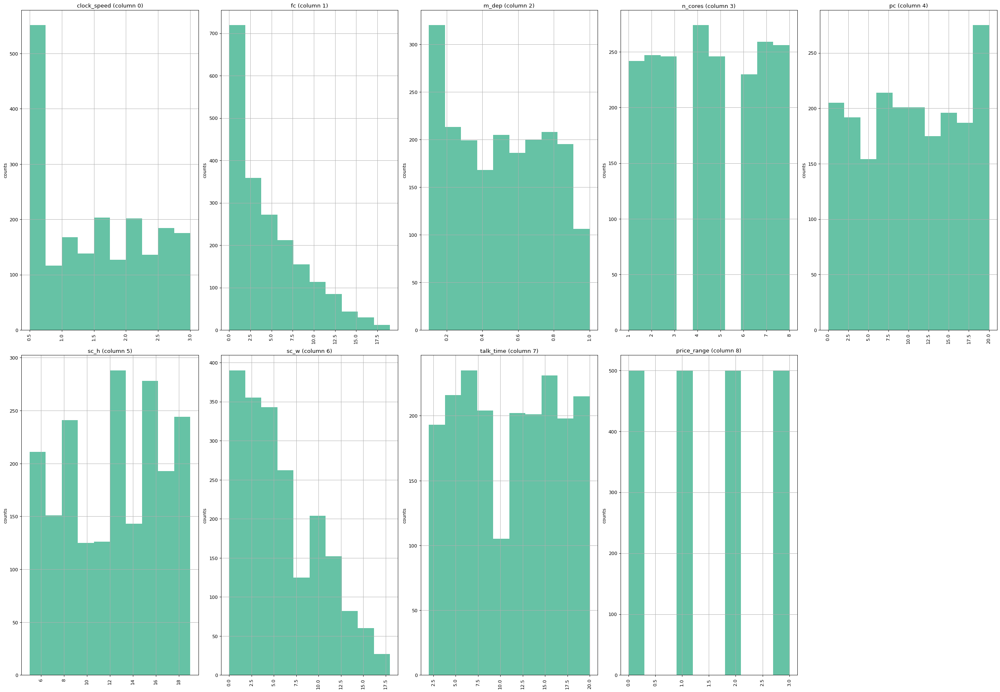

In [12]:
plotPerColumnDistribution(df, 15, 5)

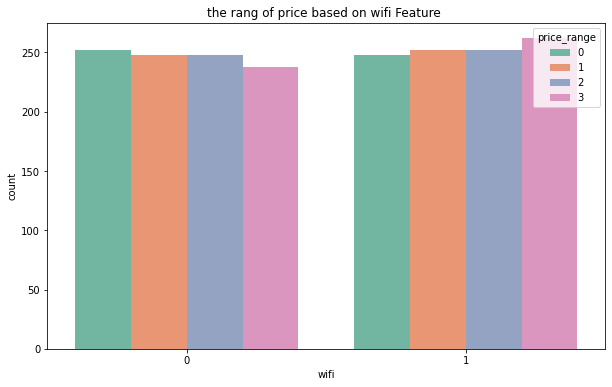

In [39]:
plt.figure(figsize=(10,6))

sns.countplot(x='wifi', data=df, hue= 'price_range').set_title('the rang of price based on wifi Feature ',fontsize=12);

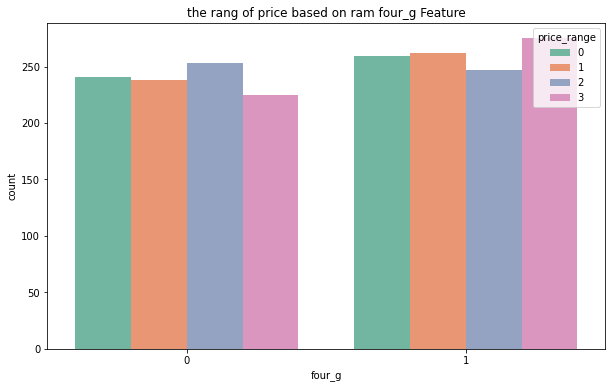

In [40]:
plt.figure(figsize=(10,6))

sns.countplot(x='four_g', data=df, hue= 'price_range').set_title('the rang of price based on ram four_g Feature',fontsize=12 );

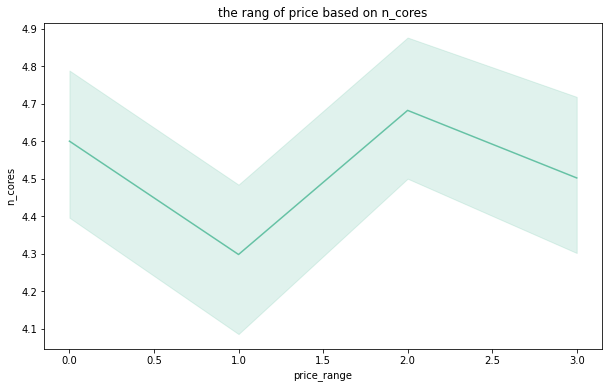

In [41]:
plt.figure(figsize=(10,6))

sns.lineplot(x='price_range', y='n_cores', data=df).set_title('the rang of price based on n_cores',fontsize=12);

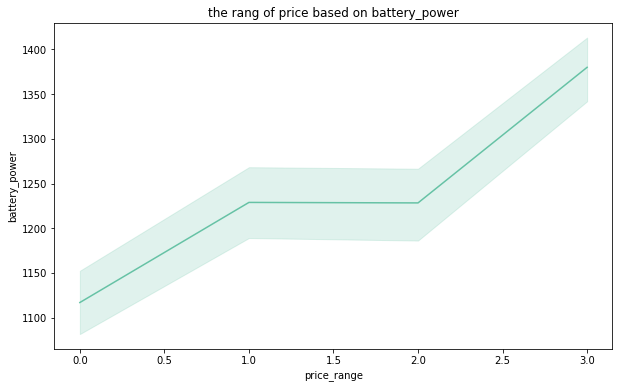

In [42]:
plt.figure(figsize=(10,6))

sns.lineplot(x='price_range', y='battery_power', data=df).set_title('the rang of price based on battery_power',fontsize=12);

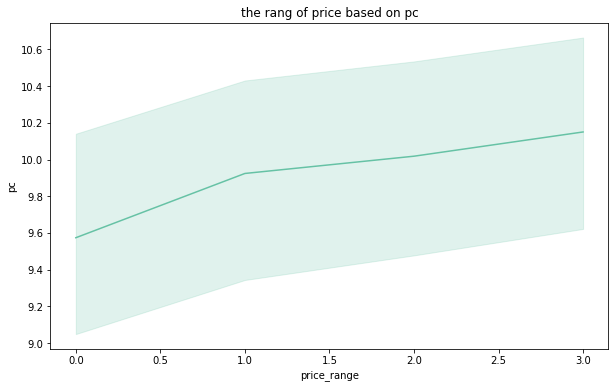

In [43]:
plt.figure(figsize=(10,6))

sns.lineplot(x='price_range', y='pc', data=df).set_title('the rang of price based on pc',fontsize=12);

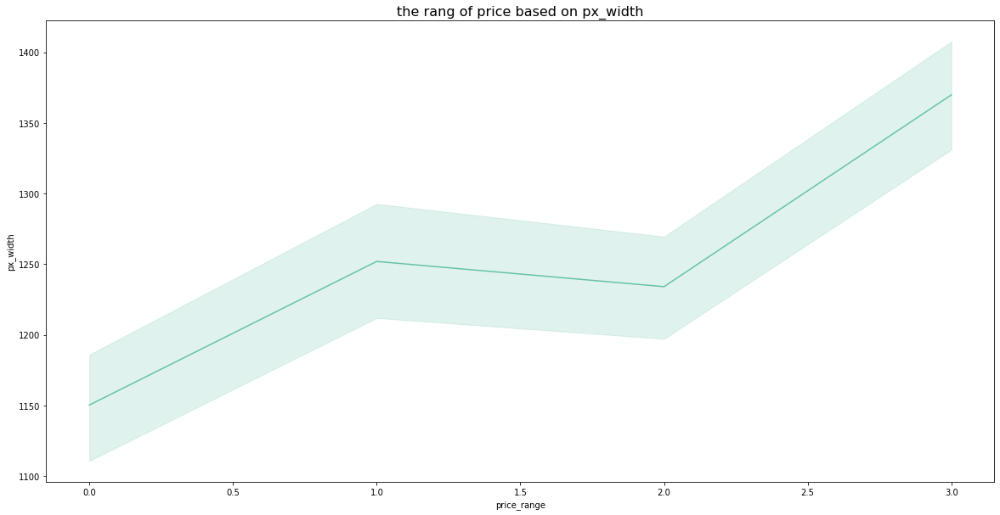

In [61]:
plt.figure(figsize=(20,10))

sns.lineplot(x='price_range', y='px_width', data=df).set_title('the rang of price based on px_width',fontsize=16);


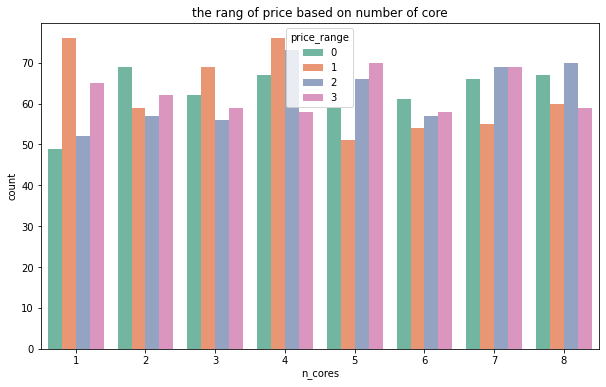

In [45]:
plt.figure(figsize=(10,6))

sns.countplot(x='n_cores', data=df, hue= 'price_range').set_title('the rang of price based on number of core',fontsize=12);

#### explore target 0  as df0 

In [8]:
df0=df.loc[df.price_range==0]
df0.tail(5)
# d.loc[d.column1 == 1, d.columns[2:]]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1987,618,1,1.0,0,9,1,13,0.1,80,4,15,591,724,1424,15,12,7,1,1,0,0
1990,1617,1,2.4,0,8,1,36,0.8,85,1,9,743,1426,296,5,3,7,1,0,0,0
1992,674,1,2.9,1,1,0,21,0.2,198,3,4,576,1809,1180,6,3,4,1,1,1,0
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,1,0,0
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,1,0


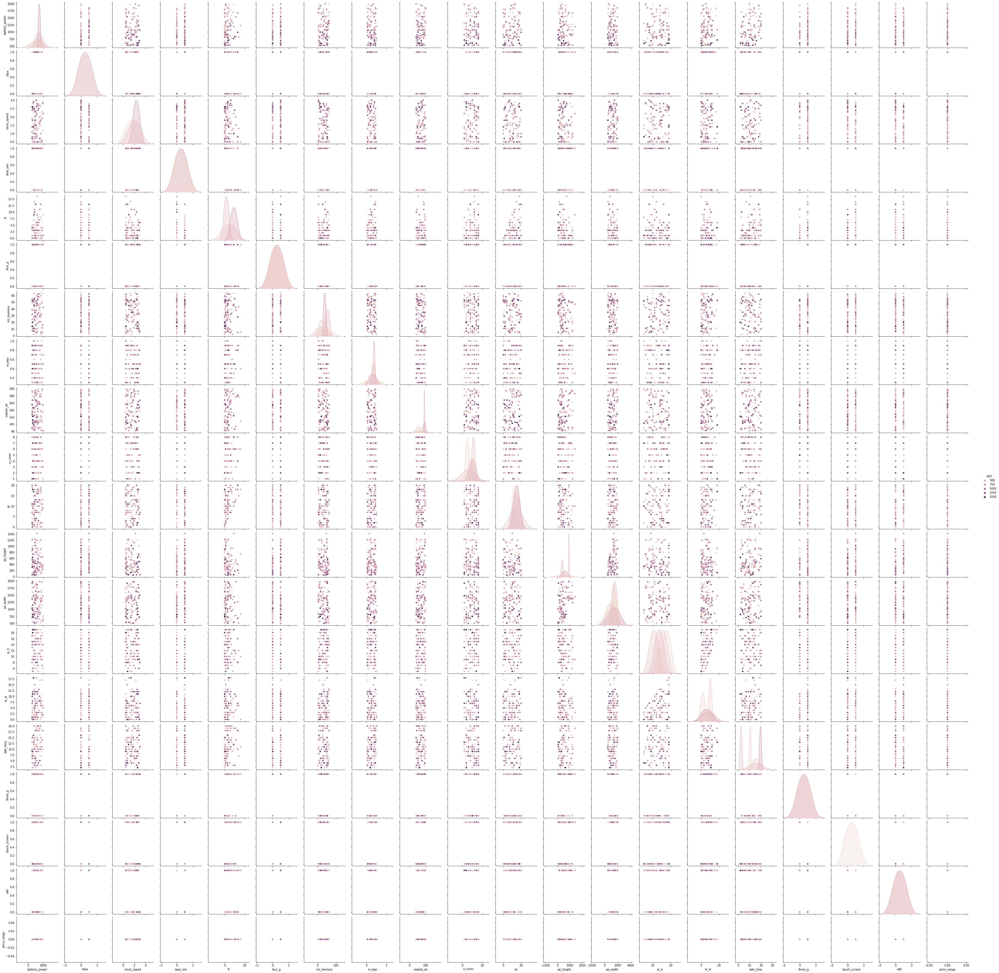

In [47]:
sns.pairplot(data=df0.sample(100) ,hue='ram')

In [48]:
df0.nunique()

battery_power    418
blue               2
clock_speed       26
dual_sim           2
fc                19
four_g             2
int_memory        63
m_dep             10
mobile_wt        118
n_cores            8
pc                21
px_height        413
px_width         422
ram              416
sc_h              15
sc_w              19
talk_time         19
three_g            2
touch_screen       2
wifi               2
price_range        1
dtype: int64

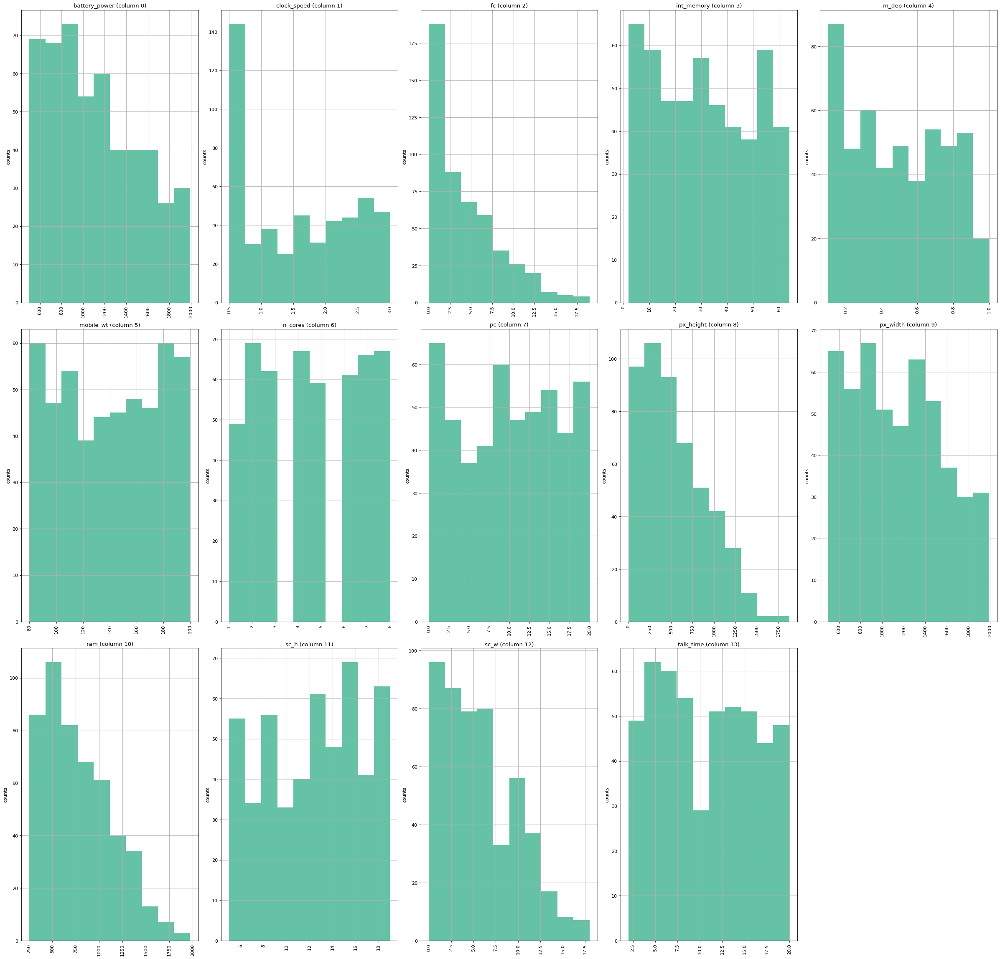

In [15]:
plotPerColumnDistribution(df0, 15, 5)

#### explore target 1 as df1

In [16]:
df1=df.loc[df.price_range==1]
df1.tail(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1981,1454,0,2.6,0,8,0,6,0.4,199,3,20,698,1018,1300,10,0,2,0,0,1,1
1984,797,0,2.2,1,0,0,37,0.9,144,7,2,206,1167,2216,9,5,6,1,0,0,1
1986,1139,1,0.9,1,6,1,58,0.5,161,2,11,742,999,1850,9,4,8,1,0,0,1
1988,1547,1,2.9,0,2,0,57,0.4,114,1,3,347,957,1620,9,2,19,0,1,1,1
1989,586,0,2.8,0,2,0,15,0.2,83,3,11,241,854,2592,12,8,3,0,0,0,1


In [50]:
df1.nunique()

battery_power    426
blue               2
clock_speed       26
dual_sim           2
fc                19
four_g             2
int_memory        63
m_dep             10
mobile_wt        121
n_cores            8
pc                21
px_height        431
px_width         426
ram              435
sc_h              15
sc_w              19
talk_time         19
three_g            2
touch_screen       2
wifi               2
price_range        1
dtype: int64

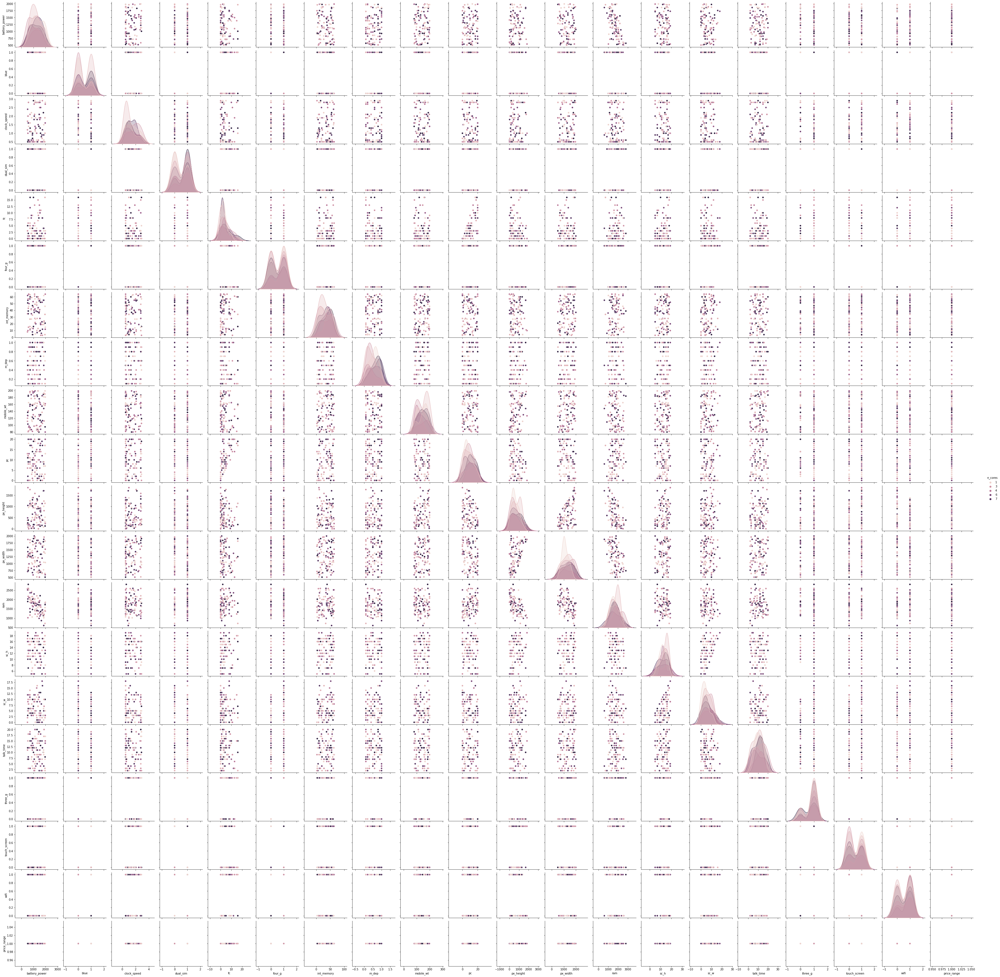

In [51]:
sns.pairplot(data=df1.sample(100) ,hue='n_cores')

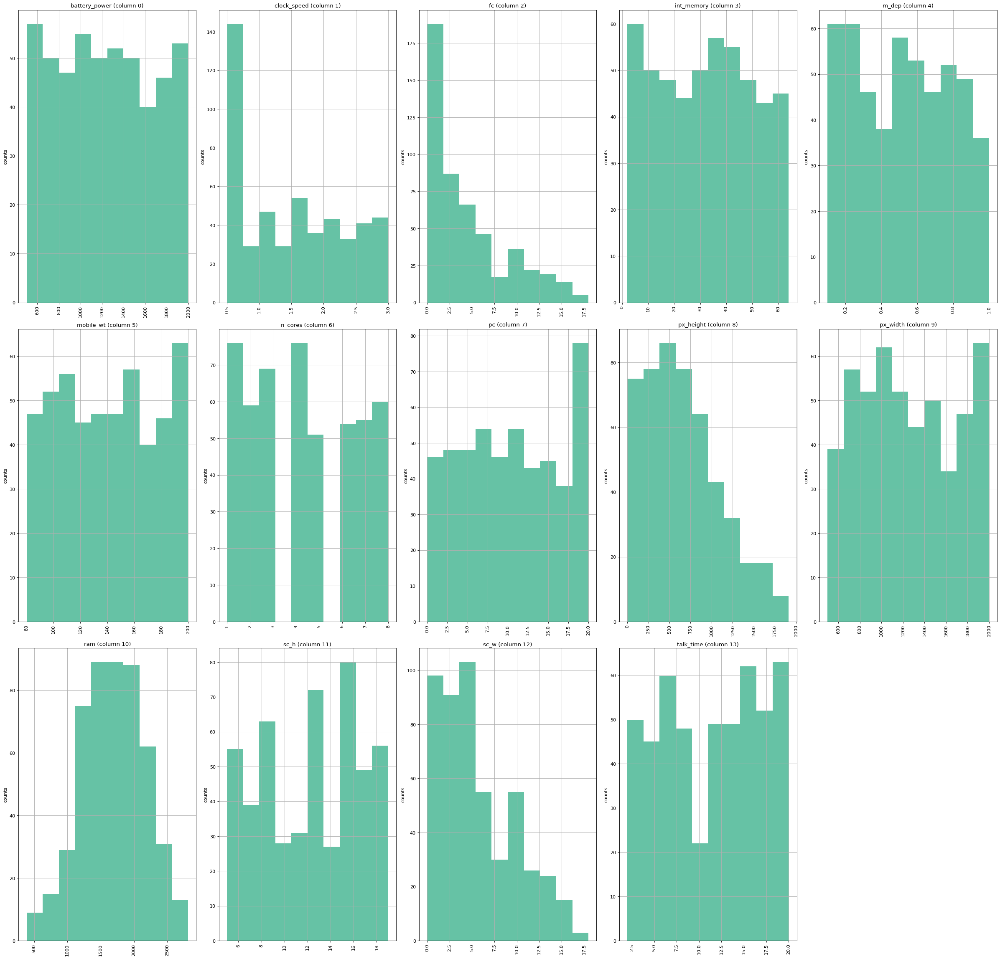

In [17]:
plotPerColumnDistribution(df1, 15, 5)

#### explore target 2 as df2

In [18]:
df2=df.loc[df.price_range==2]
df2.tail(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1970,1913,1,1.8,0,0,0,29,0.6,111,5,4,675,742,2023,17,13,8,1,1,0,2
1977,1379,0,1.1,1,1,1,18,0.2,129,2,16,838,885,2358,10,5,15,1,1,0,2
1982,1784,0,1.6,0,4,0,41,0.4,164,6,20,610,1437,2313,14,1,11,0,1,0,2
1983,1262,0,1.8,1,12,0,34,0.1,149,5,16,223,737,3248,13,3,4,0,1,1,2
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,1,2


In [53]:
df2.nunique()

battery_power    409
blue               2
clock_speed       26
dual_sim           2
fc                18
four_g             2
int_memory        63
m_dep             10
mobile_wt        118
n_cores            8
pc                21
px_height        433
px_width         422
ram              428
sc_h              15
sc_w              18
talk_time         19
three_g            2
touch_screen       2
wifi               2
price_range        1
dtype: int64

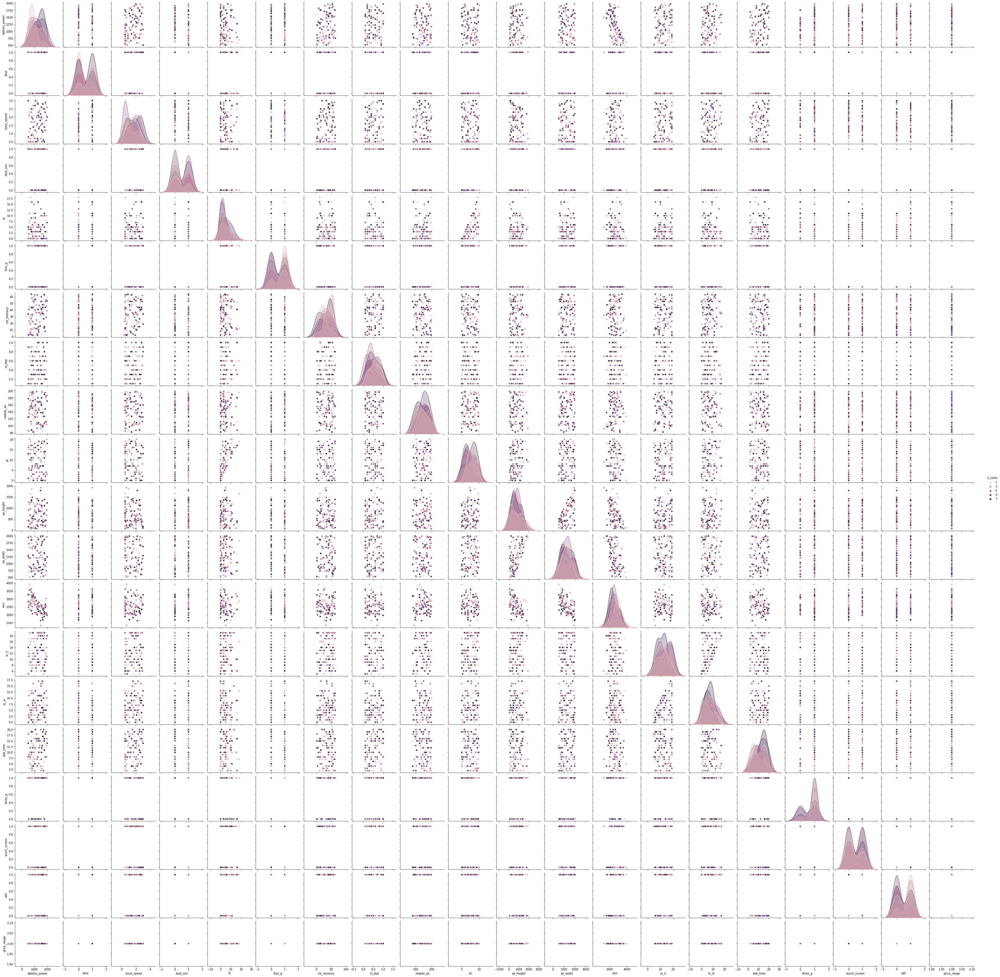

In [54]:
sns.pairplot(data=df2.sample(100) ,hue='n_cores')

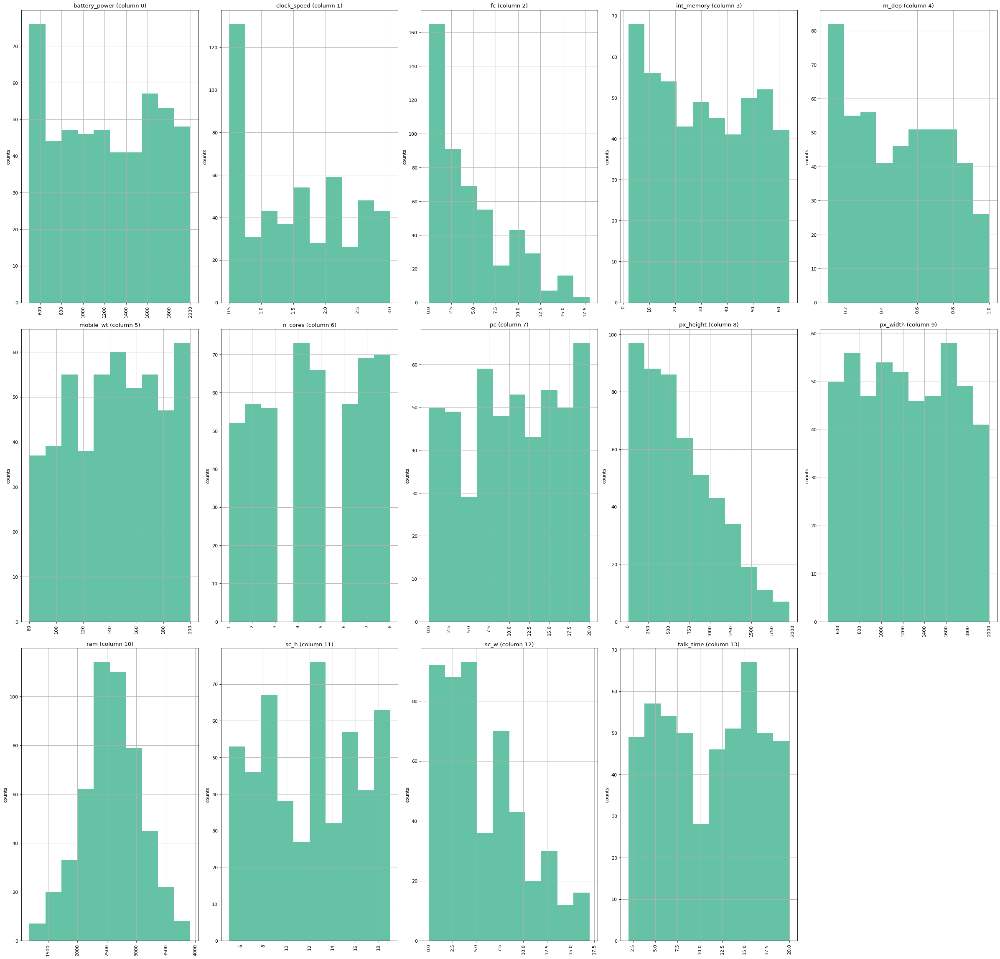

In [19]:
plotPerColumnDistribution(df2, 15, 5)

#### explore target 3 as df3

In [20]:
df3=df.loc[df.price_range==3]
df3.tail(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1991,1882,0,2.0,0,11,1,44,0.8,113,8,19,4,743,3579,19,8,20,1,1,0,3
1993,1467,1,0.5,0,0,0,18,0.6,122,5,0,888,1099,3962,15,11,5,1,1,1,3
1994,858,0,2.2,0,1,0,50,0.1,84,1,2,528,1416,3978,17,16,3,1,1,0,3
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,1,0,3
1999,510,1,2.0,1,5,1,45,0.9,168,6,16,483,754,3919,19,4,2,1,1,1,3


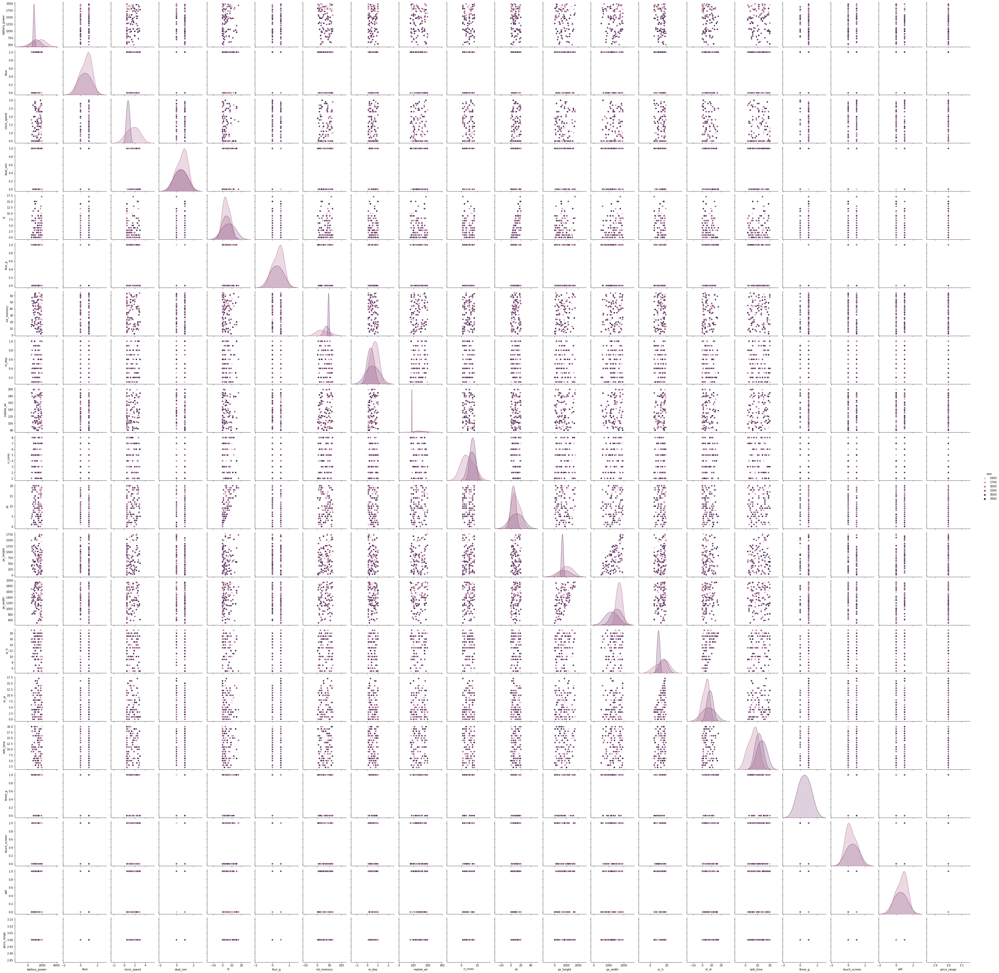

In [56]:
sns.pairplot(data=df3.sample(100) ,hue='ram')

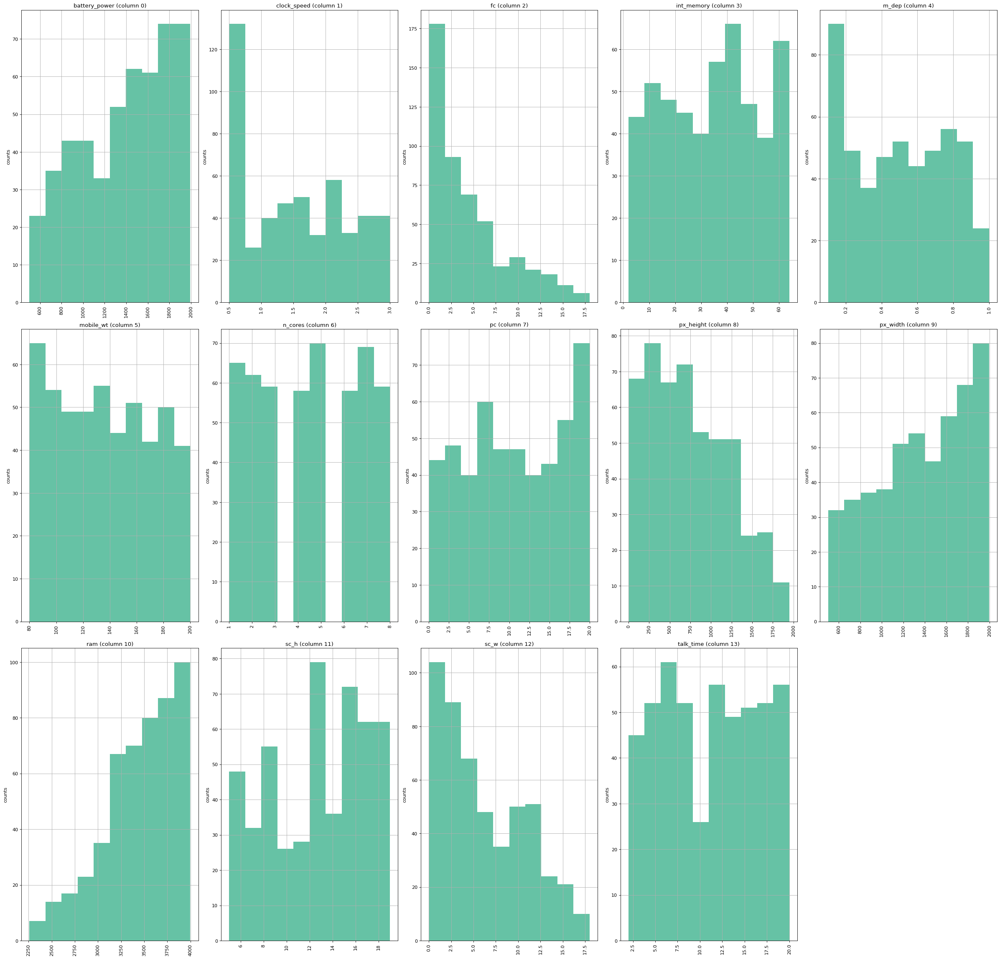

In [21]:
plotPerColumnDistribution(df3, 15, 5)